# Train and Evaluate a Faster-RCNN from Supervisely dataset in PyTorch

In [1]:
import torch

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from superviselyboxes import SuperviselyBoxes

import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

## Load data and show a sample labeled image

In [2]:
DATA_ROOT = '/path/to/data/'

train_data = SuperviselyBoxes(root = DATA_ROOT,
                        dataset_name = 'train',
                        transform=None)
val_data = SuperviselyBoxes(root = DATA_ROOT,
                        dataset_name = 'test',
                        transform=None)

print('Number of train samples: ', len(train_data))
print('Number of test samples: ', len(val_data))

img, target = train_data[3] # load 4th sample
print("Image Size: ", img.size())
print(target)

Number of train samples:  91
Number of test samples:  46
Image Size:  torch.Size([3, 720, 1280])
{'boxes': tensor([[693., 166., 731., 197.],
        [451., 336., 494., 368.],
        [432., 140., 738., 370.]]), 'labels': tensor([1, 1, 2]), 'image_id': tensor([3]), 'area': tensor([ 1178.,  1376., 70380.]), 'iscrowd': tensor([0, 0, 0])}


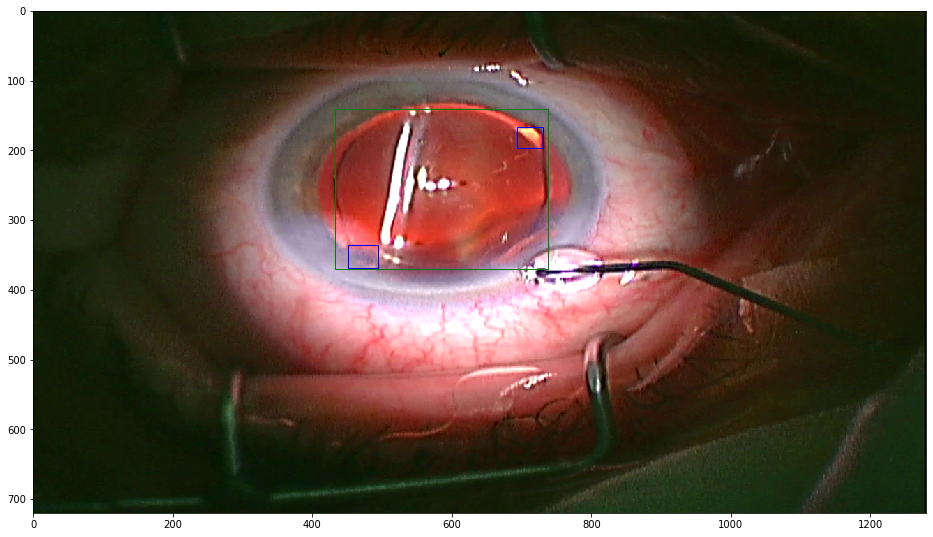

In [3]:
img = img.cpu().numpy().transpose(1, 2, 0)

# color dict, change to your liking
col_dict = {1:'blue', 2:'green', 3:'purple', 4:'yellow', 5:'orange', 6:'pink'}

# Display the image
plt.figure(figsize=(16,10))
plt.imshow(img)

# Get the current reference
ax = plt.gca()

for i in range(len(target['boxes'])):
    x1, x2, x3, x4 = map(int, target['boxes'][i].tolist())
    width = x3 - x1
    height = x4 - x2
    # Create a Rectangle patch
    color = col_dict[int(target['labels'][i]) % len(col_dict.keys())]
    rect = patches.Rectangle((x1,x2),width,height,linewidth=1,edgecolor=color,facecolor='none')
    # Add the patch to the Axes
    ax.add_patch(rect)

plt.show()

## Model definition

In [4]:
def get_model_faster_rcnn(num_classes):
    # load an instance segmentation model pre-trained pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

## Training

In [6]:
# Helper function from torchvision
def collate_fn(batch):
    return tuple(zip(*batch))

In [6]:
# Data
train_data_loader = torch.utils.data.DataLoader(
    train_data, batch_size=4, shuffle=True, num_workers=4,
    collate_fn=collate_fn
)

# 2 classes + background
num_classes = 3
num_epochs = 40
model = get_model_faster_rcnn(num_classes)

# select device (whether GPU or CPU)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# move model to the right device
model.to(device)
    
# parameters
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

len_dataloader = len(train_data_loader)

for epoch in range(num_epochs):
    model.train()
    i = 0    
    for imgs, annotations in train_data_loader:
        i += 1
        imgs = list(img.to(device) for img in imgs)
        annotations = [{k: v.to(device) for k, v in t.items()} for t in annotations]
        loss_dict = model(imgs, annotations)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        if (i % 3) == 0:
            print(f'Iteration: {i}/{len_dataloader}, Loss: {losses}')
#     evaluate(model, data_loader, device=device)

Iteration: 3/23, Loss: 0.7103192210197449
Iteration: 6/23, Loss: 0.6864302754402161
Iteration: 9/23, Loss: 0.43774935603141785
Iteration: 12/23, Loss: 0.3892775774002075
Iteration: 15/23, Loss: 0.49607110023498535
Iteration: 18/23, Loss: 0.40138113498687744
Iteration: 21/23, Loss: 0.5008400678634644
Iteration: 3/23, Loss: 0.3626350164413452
Iteration: 6/23, Loss: 0.423108845949173
Iteration: 9/23, Loss: 0.3285472095012665
Iteration: 12/23, Loss: 0.3904218375682831
Iteration: 15/23, Loss: 0.29819005727767944
Iteration: 18/23, Loss: 0.2774350047111511
Iteration: 21/23, Loss: 0.2595655620098114
Iteration: 3/23, Loss: 0.21453794836997986
Iteration: 6/23, Loss: 0.16275207698345184
Iteration: 9/23, Loss: 0.18512552976608276
Iteration: 12/23, Loss: 0.21051907539367676
Iteration: 15/23, Loss: 0.22644349932670593
Iteration: 18/23, Loss: 0.22219917178153992
Iteration: 21/23, Loss: 0.153140127658844
Iteration: 3/23, Loss: 0.17075830698013306
Iteration: 6/23, Loss: 0.13429783284664154
Iteration: 9

Iteration: 21/23, Loss: 0.025606459006667137
Iteration: 3/23, Loss: 0.021745983511209488
Iteration: 6/23, Loss: 0.01718580722808838
Iteration: 9/23, Loss: 0.021233990788459778
Iteration: 12/23, Loss: 0.017844242975115776
Iteration: 15/23, Loss: 0.025125868618488312
Iteration: 18/23, Loss: 0.02899268828332424
Iteration: 21/23, Loss: 0.02064889669418335
Iteration: 3/23, Loss: 0.02668830193579197
Iteration: 6/23, Loss: 0.02230527065694332
Iteration: 9/23, Loss: 0.026049382984638214
Iteration: 12/23, Loss: 0.022272897884249687
Iteration: 15/23, Loss: 0.0184196624904871
Iteration: 18/23, Loss: 0.020124057307839394
Iteration: 21/23, Loss: 0.026818610727787018
Iteration: 3/23, Loss: 0.02544592320919037
Iteration: 6/23, Loss: 0.022916555404663086
Iteration: 9/23, Loss: 0.02707759104669094
Iteration: 12/23, Loss: 0.018880514428019524
Iteration: 15/23, Loss: 0.020044498145580292
Iteration: 18/23, Loss: 0.022730328142642975
Iteration: 21/23, Loss: 0.02478880248963833
Iteration: 3/23, Loss: 0.0236

In [7]:
torch.save(model.state_dict(), 'fasterrcnn.pt')

## Predict on unseen batch of validation set

In [9]:
val_data_loader = torch.utils.data.DataLoader(
    val_data, batch_size=16, shuffle=True, num_workers=4,
    collate_fn=collate_fn
)

# For Evaluation
device = torch.device("cuda")
model = get_model_faster_rcnn(num_classes=3)
model.load_state_dict(torch.load('fasterrcnn.pt'))
model.to(device)
# Make sure to call input = input.to(device) on any input tensors that you feed to the model
model.eval()

imgs, targets = next(iter(val_data_loader))
imgs = list(img.to(device) for img in imgs)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
preds = model(imgs)

## Show predictions

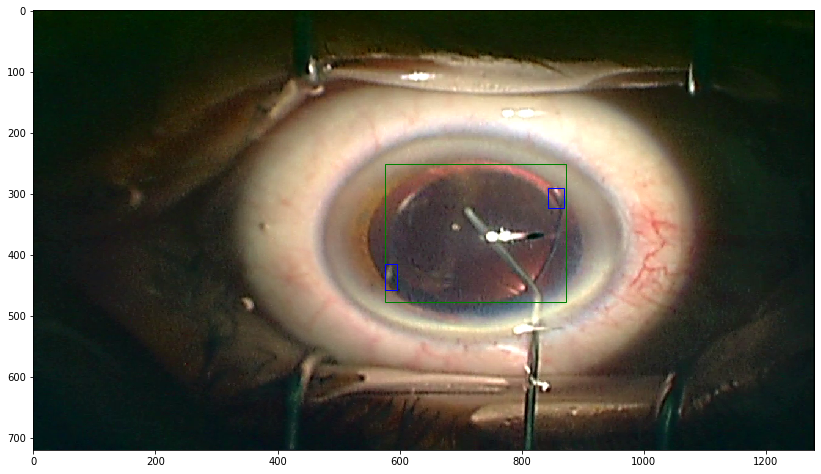

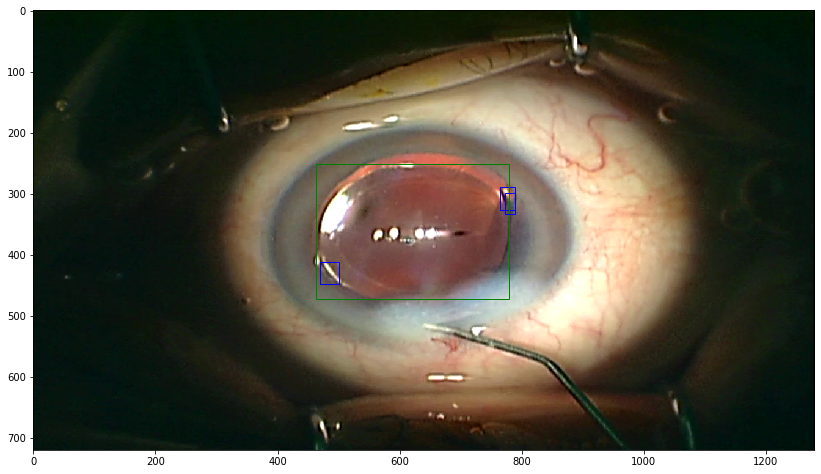

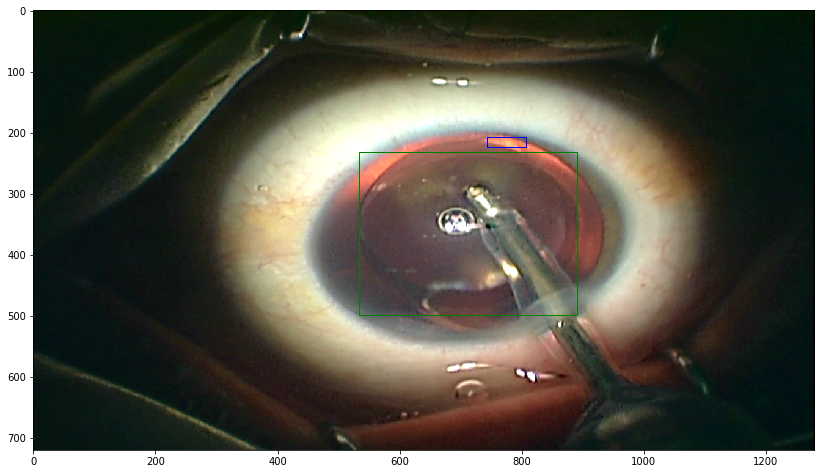

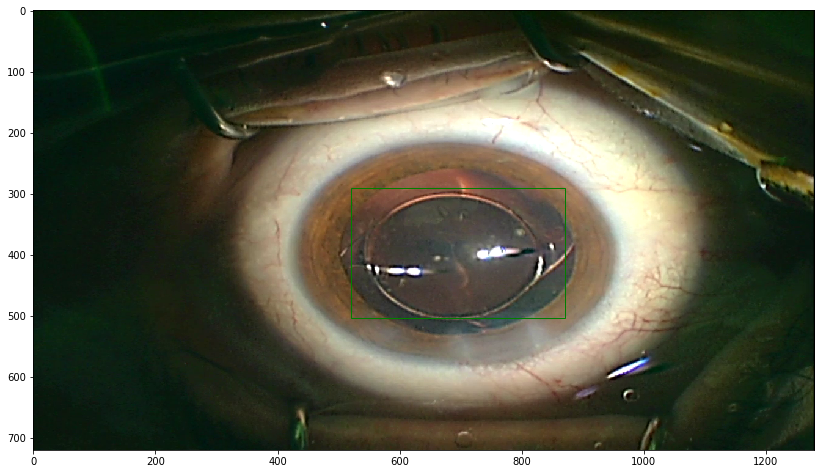

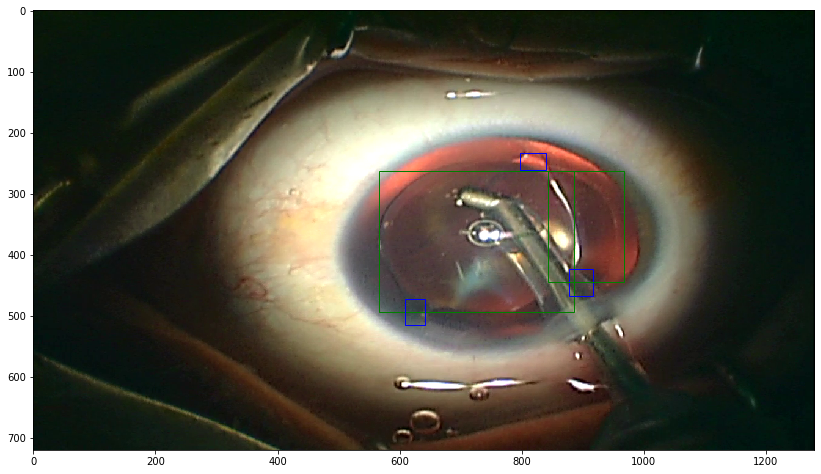

...

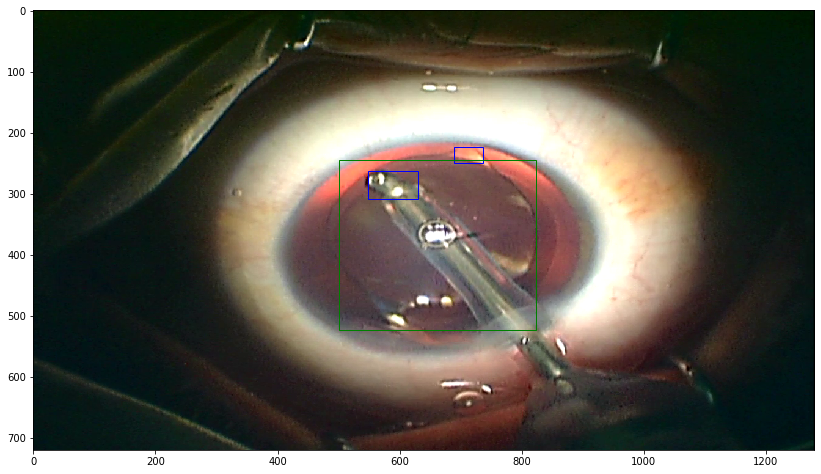

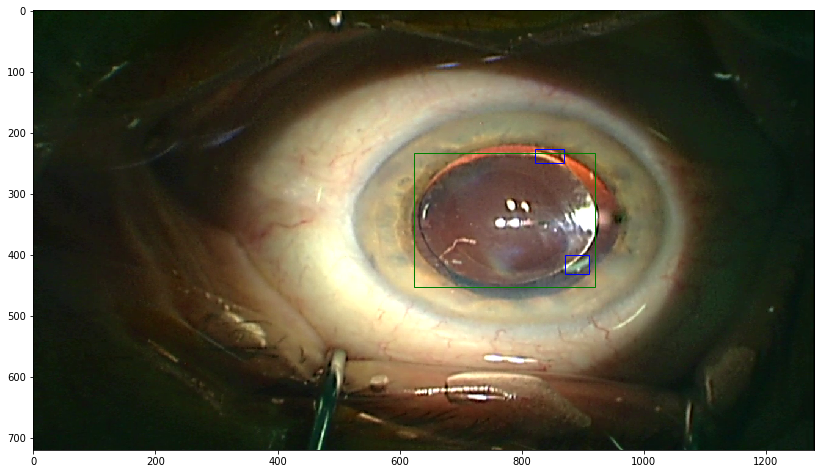

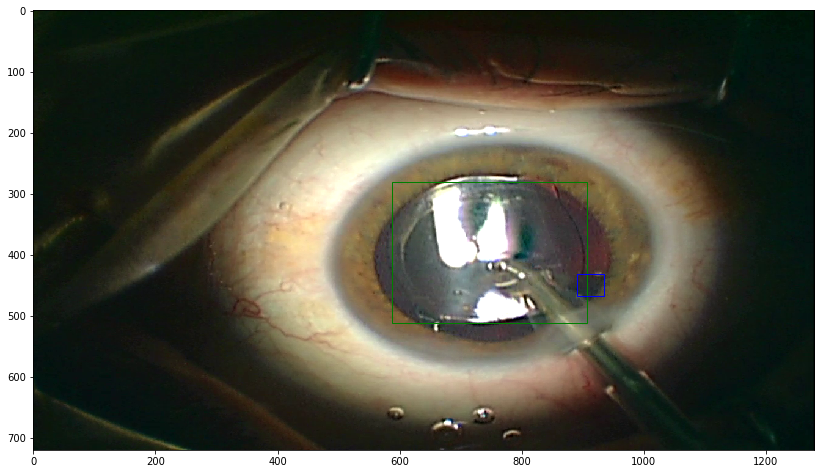

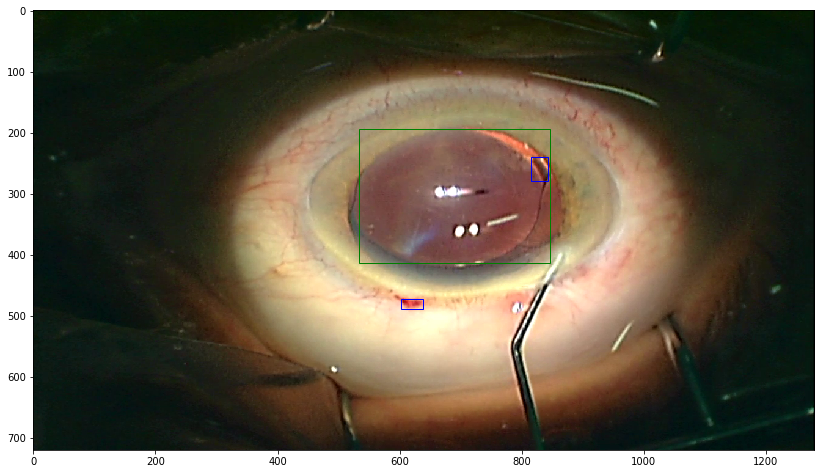

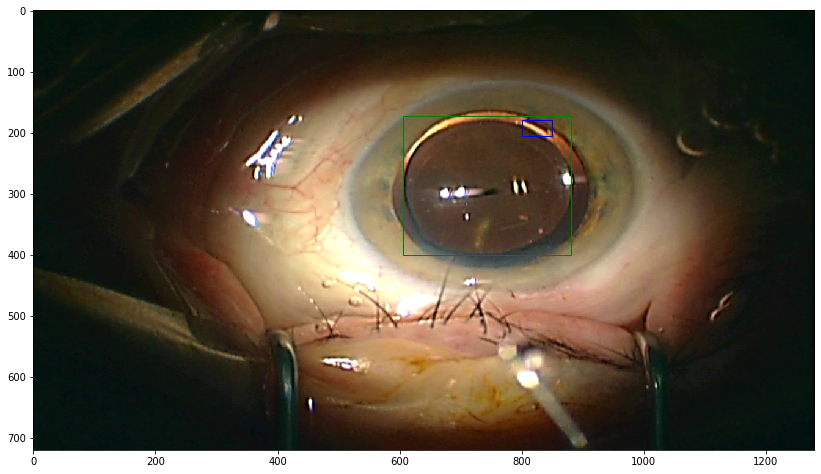

In [10]:
for i in range(len(preds)):
    img_idx = i

    img = imgs[img_idx].cpu().numpy().transpose(1, 2, 0)

    # Display the image
    plt.figure(figsize=(14,9))
    plt.imshow(img)

    # Get the current reference
    ax = plt.gca()

    for i in range(preds[img_idx]['boxes'].size()[0]):
        x1, x2, x3, x4 = map(int, preds[img_idx]['boxes'][i].tolist())
        width = x3 - x1
        height = x4 - x2
        # Create a Rectangle patch
        color = col_dict[int(preds[img_idx]['labels'][i]) % len(col_dict.keys())]
        rect = patches.Rectangle((x1,x2),width,height,linewidth=1,edgecolor=color,facecolor='none')
        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()